# Problem Statement:

Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company. A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:

• Which variables are important to predict the price of variable?

• How do these variables describe the price of the house?

In [1]:
# Importing required Libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from sklearn.preprocessing import power_transform
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
from sklearn import metrics
from sklearn.metrics import r2_score

import pickle
import warnings
warnings.filterwarnings('ignore')

In [2]:
df_train = pd.read_csv('train.csv')

df_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000


# Check shape of dataset

In [3]:
df_train.shape

(1168, 81)

In [4]:
# checking the columns of the train dataset

df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [5]:
# check if dataset ahs null values

df_train.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [6]:
pd.set_option('display.max_columns', None)

pd.set_option('display.max_rows', None)

<AxesSubplot:>

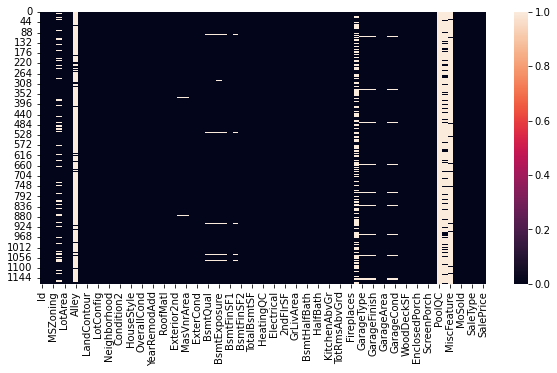

In [7]:
#Plot a heatmap to view the null values

plt.figure(figsize = [10, 5])

sns.heatmap(df_train.isnull())

In [8]:
#check datatypes of the dataset

df_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [9]:
#Check information of the dataset

df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [10]:
# Import the test dataset

df_test = pd.read_csv('test.csv')

df_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,

In [11]:
# check the shape of test dataset

df_test.shape

(292, 80)

In [12]:
#check total columns of the test dataset

df_test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [13]:
df_test.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

<AxesSubplot:>

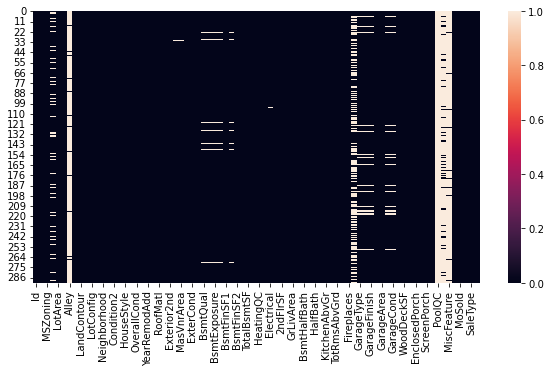

In [14]:
# Plot a heatmap showing the null values

plt.figure(figsize = [10, 5])

sns.heatmap(df_test.isnull())

In [15]:
#check the datatypes of test dataset

df_test.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [16]:
# check the information of test dataset

df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

In [17]:
# Lets link Train & Test dataset

df_train['Source'] = 'train'

df_test['Source'] = 'test'

df = pd.concat([df_train, df_test], ignore_index = True)

In [18]:
df.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Source
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000.0,train
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000.0,train
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790.0,train
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000.0,train
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000.0,train


In [19]:
# Check the shape of dataset

df.shape

(1460, 82)

In [20]:
#check the categorical and the numerical values

numerical = df.select_dtypes(include = [np.number]).columns

categorical = df.select_dtypes(include = [np.object]).columns

In [21]:
numerical

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [22]:
categorical

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'Source'],
      dtype='object')

In [23]:
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

<AxesSubplot:>

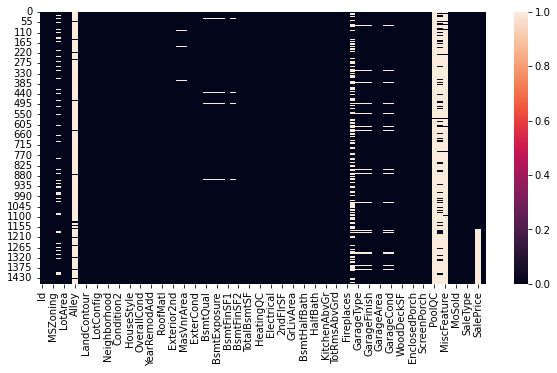

In [24]:
# Plot a heat map for visualizing null values

plt.figure(figsize = [10, 5])

sns.heatmap(df.isnull())

# Handle the missing values

In [25]:
df['PoolQC'].value_counts()

Gd    3
Ex    2
Fa    2
Name: PoolQC, dtype: int64

In [26]:
# We can see most of the values are empty, fill the empty values with NA.

df['PoolQC'].fillna('NA', inplace = True)

In [27]:
df['MiscFeature'].value_counts()

Shed    49
Gar2     2
Othr     2
TenC     1
Name: MiscFeature, dtype: int64

In [28]:
# Similiarly in this column most values in rows are empty, fill it with NA

df['MiscFeature'].fillna('NA', inplace = True)

In [29]:
#check the value counts for Alley

df['Alley'].value_counts()

Grvl    50
Pave    41
Name: Alley, dtype: int64

In [30]:
#Filling with NA

df['Alley'].fillna('NA', inplace = True)

In [31]:
# check the value counts for Fence

df['Fence'].value_counts()

MnPrv    157
GdPrv     59
GdWo      54
MnWw      11
Name: Fence, dtype: int64

In [32]:
# Fill with NA

df['Fence'].fillna('NA', inplace = True)

In [33]:
# Check the value counts for FireplaceQu

df['FireplaceQu'].value_counts()

Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

In [34]:
# Fill the values with NA

df['FireplaceQu'].fillna('NA', inplace = True)

In [35]:
# Check for the mean value of the column 'LotFrontage'

df['LotFrontage'].mean()

70.04995836802665

In [36]:
# Replace missing values with the mean of the column.

df['LotFrontage'].fillna(df['LotFrontage'].mean(), inplace = True)

In [37]:
# Checking for the value counts:

df['GarageType'].value_counts()

Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [38]:
# Replace missing values with NA in GarageType

df['GarageType'].fillna('NA', inplace = True)

In [39]:
# Replacing the missing values with 'NA' to show that Garage is not avaiable

df['GarageYrBlt'].fillna('NA', inplace = True)

In [40]:
# Checking for the value counts

df['GarageFinish'].value_counts()

Unf    605
RFn    422
Fin    352
Name: GarageFinish, dtype: int64

In [41]:
# Replace missing values with 'NA' showing garage option is not available

df['GarageFinish'].fillna('NA', inplace = True)

In [42]:
# Replace the missing values with 'NA' showing Garage is not available

df['GarageQual'].fillna('NA', inplace = True)

In [43]:
# Replace the missing values with 'NA'

df['GarageCond'].fillna('NA', inplace = True)

In [44]:
# Replace the missing values with NA 

df['BsmtFinType2'].fillna('NA', inplace = True)

In [45]:
# Replace the missing values with 'NA'

df['BsmtExposure'].fillna('NA', inplace = True)

In [46]:
# Replace the missing values with 'NA'

df['BsmtQual'].fillna('NA', inplace = True)

In [47]:
# Replace the missing  values with 'NA'

df['BsmtCond'].fillna('NA', inplace = True)

In [48]:
# Replace the missing values with 'NA'

df['BsmtFinType1'].fillna('NA', inplace = True)

In [49]:
# Checking for the value counts

df['MasVnrType'].value_counts()

None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [50]:
# Replace the missing values with 'None'

df['MasVnrType'].fillna('None', inplace = True)

In [51]:
# Calculating the mean value

df['MasVnrArea'].mean()

103.68526170798899

In [52]:
# Replace the missing values with the mean value

df['MasVnrArea'].fillna(df['MasVnrArea'].mean(), inplace = True)

In [53]:
# Check for the value counts

df['Electrical'].value_counts()

SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [54]:
# Replace the missing value with 'SBrkr'

df['Electrical'].fillna('SBrkr', inplace = True)

In [55]:
# Check for the missing values in whole dataset

df.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage        0
LotArea            0
Street             0
Alley              0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         0
MasVnrArea         0
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

# Data Visualization

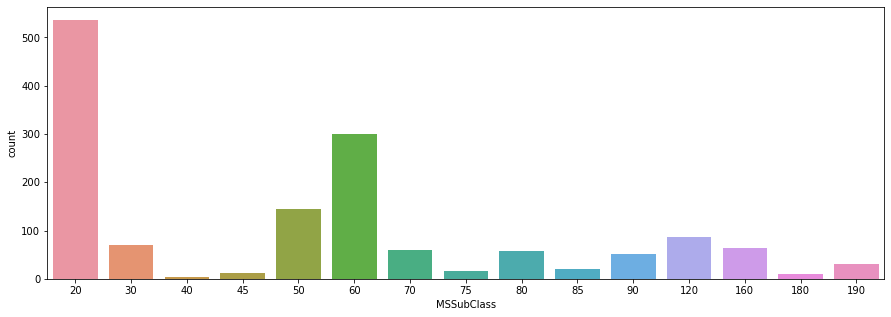

In [56]:
#Visualize the value counts of the columns MSSubClass

plt.figure(figsize = (15, 5))

sns.countplot(df.MSSubClass) 

plt.show()

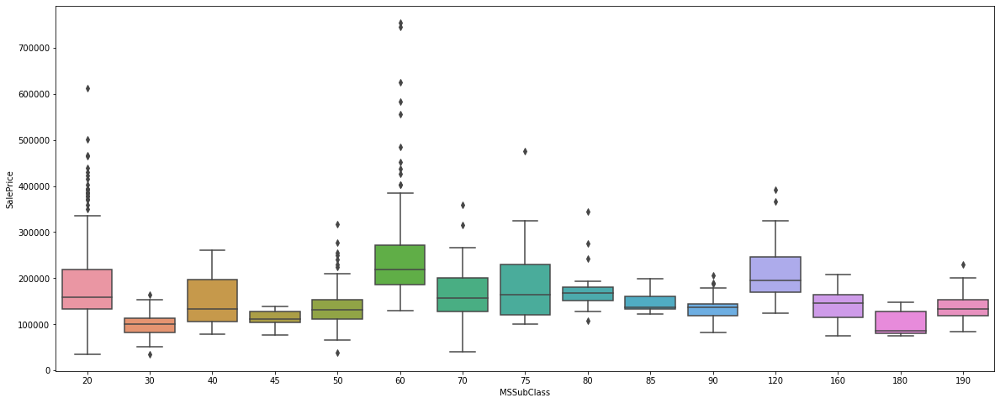

In [57]:
plt.figure(figsize = (20, 8))

sns.boxplot(x = 'MSSubClass', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False))

plt.show()

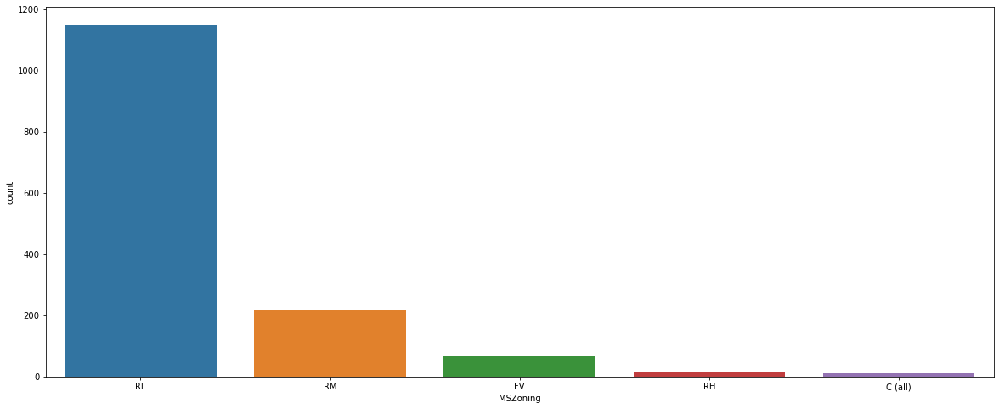

In [58]:
# Check the value counts of the column 'MSZoning'

plt.figure(figsize = [20, 8])

sns.countplot(df.MSZoning)

plt.show()

In [59]:
# check for the type of street to property

df['Street'].value_counts()

Pave    1454
Grvl       6
Name: Street, dtype: int64

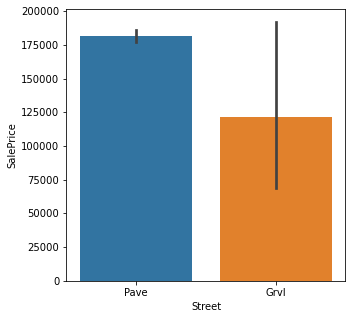

In [60]:
# Checking for the sale price on the basis of road access to the property

plt.figure(figsize = [5, 5])

sns.barplot(x = 'Street', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False))

plt.show()

<AxesSubplot:ylabel='Alley'>

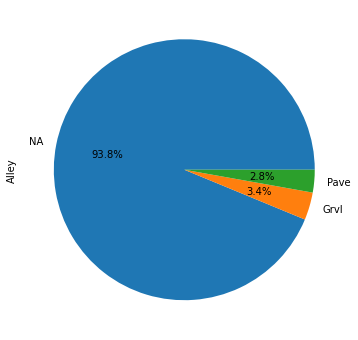

In [61]:
# Let's check the alley access to property

plt.figure(figsize = [6, 6])

df['Alley'].value_counts().plot.pie(autopct = '%0.1f%%')

<Figure size 720x432 with 0 Axes>

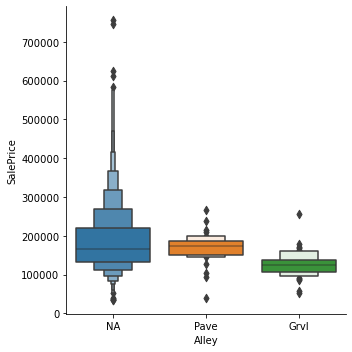

In [62]:
# Check the effect of alley access on sale price.

plt.figure(figsize = [10, 6])

sns.catplot(x = 'Alley', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False), kind = 'boxen')

plt.show()

In [63]:
# Drop the alley column

df = df.drop(['Alley'], axis = 1)

df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Source
0,127,120,RL,70.049958,4928,Pave,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NA,NA,NA,0,2,2007,WD,Normal,128000.0,train
1,889,20,RL,95.000000,15865,Pave,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NA,NA,NA,0,10,2007,WD,Normal,268000.0,train
2,793,60,RL,92.000000,9920,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NA,NA,NA,0,6,2007,WD,Normal,269790.0,train
3,110,20,RL,105.000000,11751,Pave,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NA,MnPrv,NA,0,1,2010,COD,Normal,190000.0,train
4,422,20,RL,70.049958,16635,Pave,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NA,NA,NA,0,6,2009,WD,Normal,215000.0,train


<AxesSubplot:ylabel='LotShape'>

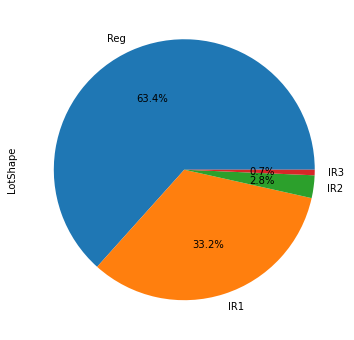

In [64]:
# Let's check the General shape of property

plt.figure(figsize = [10, 6])

df['LotShape'].value_counts().plot.pie(autopct = '%0.1f%%')

<Figure size 1440x432 with 0 Axes>

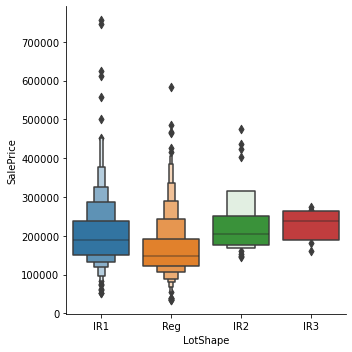

In [65]:
# Checking the relation of property shape on the sale price

plt.figure(figsize = [20, 6])

sns.catplot(x = 'LotShape', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False), kind = 'boxen')

plt.show()

<AxesSubplot:xlabel='LandContour', ylabel='count'>

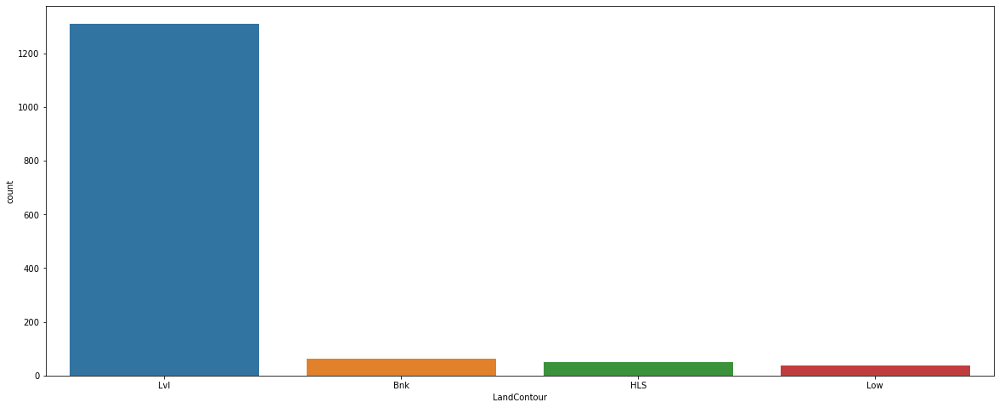

In [66]:
# Check for the LandContour of the property

plt.figure(figsize = [20, 8])

sns.countplot(df['LandContour'])

<Figure size 1440x576 with 0 Axes>

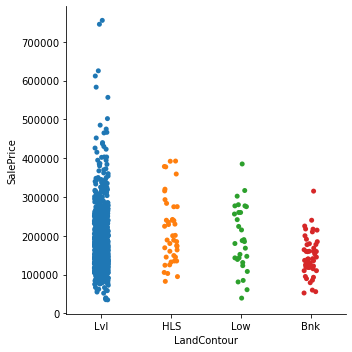

In [67]:
# Check the effect of LandContour of property on sale price

plt.figure(figsize = [20, 8])

sns.catplot(x = 'LandContour', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False))

<AxesSubplot:ylabel='Utilities'>

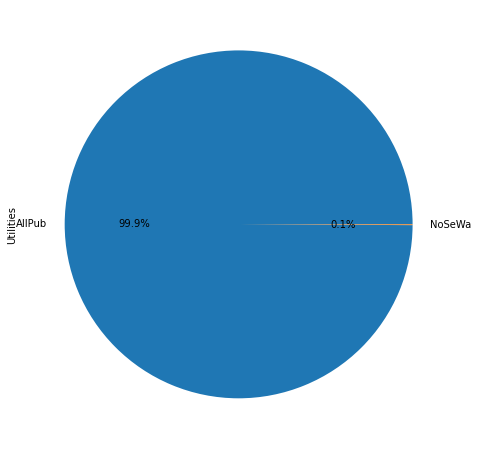

In [68]:
# Check the type of utilities available in the property

plt.figure(figsize = [20, 8])

df['Utilities'].value_counts().plot.pie(autopct = '%0.1f%%')

In [69]:
# Drop the 'Utilities' column

df = df.drop(['Utilities'], axis = 1)

df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Source
0,127,120,RL,70.049958,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NA,NA,NA,0,2,2007,WD,Normal,128000.0,train
1,889,20,RL,95.000000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NA,NA,NA,0,10,2007,WD,Normal,268000.0,train
2,793,60,RL,92.000000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NA,NA,NA,0,6,2007,WD,Normal,269790.0,train
3,110,20,RL,105.000000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NA,MnPrv,NA,0,1,2010,COD,Normal,190000.0,train
4,422,20,RL,70.049958,16635,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NA,NA,NA,0,6,2009,WD,Normal,215000.0,train


<AxesSubplot:ylabel='LotConfig'>

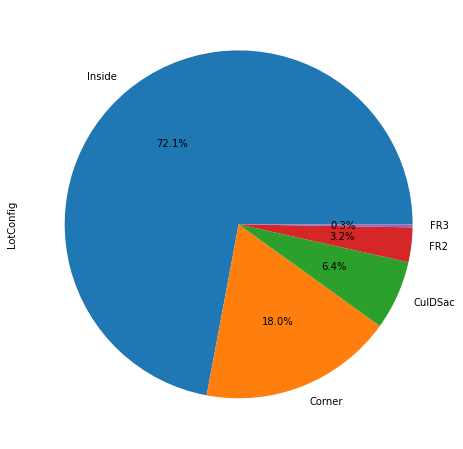

In [70]:
# Check for the lot configuration of properties

plt.figure(figsize = [20, 8])

df['LotConfig'].value_counts().plot.pie(autopct = '%0.1f%%')

<Figure size 1440x576 with 0 Axes>

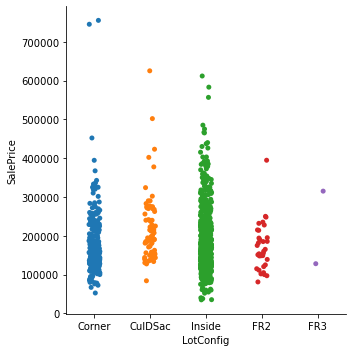

In [71]:
# Check for Lot configuration and its effect on sale price.

plt.figure(figsize = [20, 8])

sns.catplot(x = 'LotConfig', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False))

<AxesSubplot:ylabel='LandSlope'>

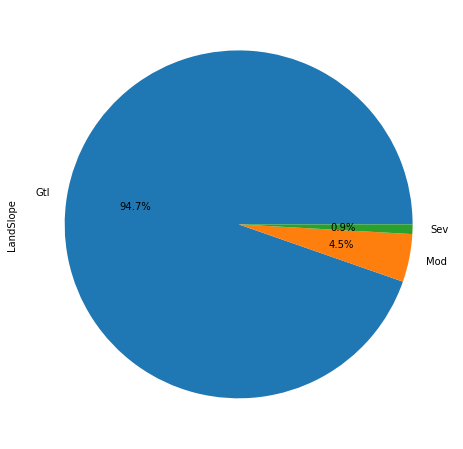

In [72]:
# Check for slope of the property

plt.figure(figsize = [20, 8])

df['LandSlope'].value_counts().plot.pie(autopct = '%0.1f%%')

<Figure size 1440x576 with 0 Axes>

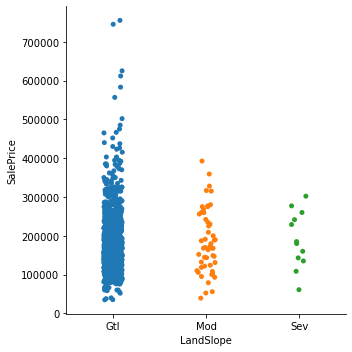

In [73]:
# Check Landslope wise sale pricing of the properties

plt.figure(figsize = [20, 8])

sns.catplot(x = 'LandSlope', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False))

In [74]:
# Look at neighborhood within Ames city limits

df['Neighborhood'].value_counts()

NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
Blmngtn     17
MeadowV     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

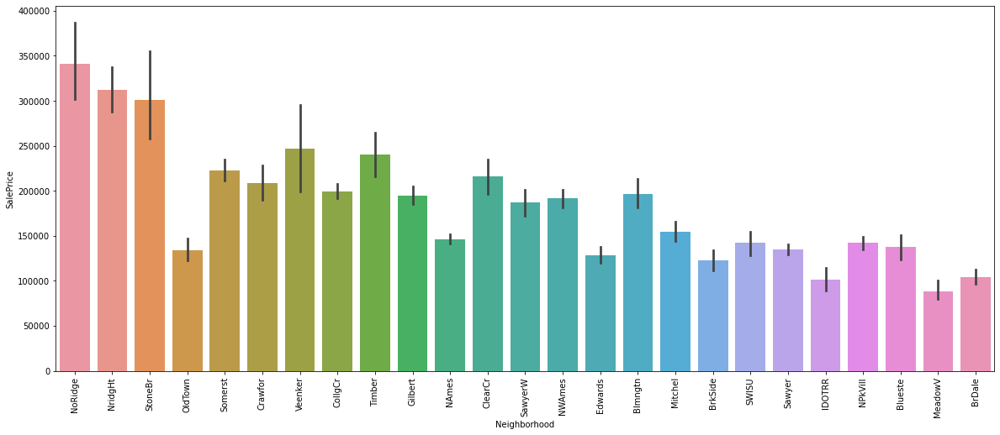

In [75]:
# Check effect of Neighborhood on the sale price

plt.figure(figsize = [20, 8])

sns.barplot(x = 'Neighborhood', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False))

plt.xticks(rotation = 90)

plt.show()

In [76]:
# check for value counts of condition1

df['Condition1'].value_counts()

Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: Condition1, dtype: int64

In [77]:
# Check the value counts of Condition2

df['Condition2'].value_counts()

Norm      1445
Feedr        6
PosN         2
Artery       2
RRNn         2
RRAe         1
PosA         1
RRAn         1
Name: Condition2, dtype: int64

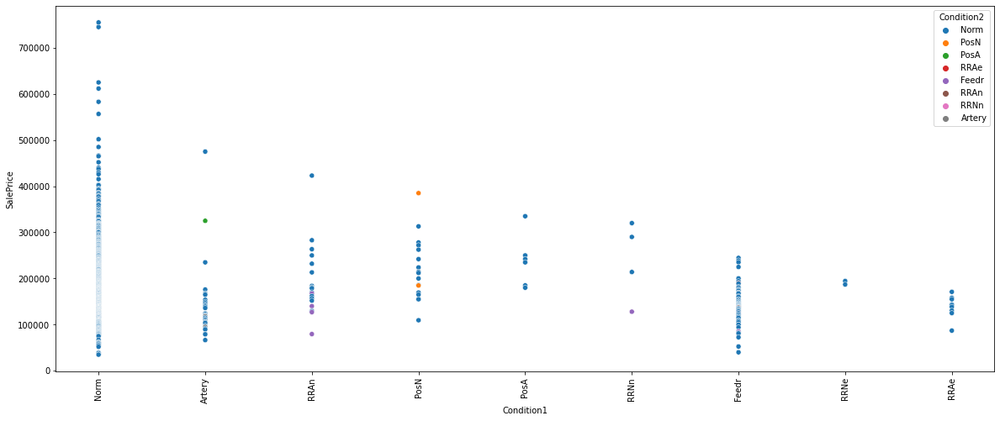

In [78]:
# Check the sale pricing with different Condition wise

plt.figure(figsize = [20, 8])

sns.scatterplot(x = 'Condition1', y = 'SalePrice', hue = 'Condition2', data = df.sort_values('SalePrice', ascending = False))

plt.xticks(rotation = 90)

plt.show()

In [79]:
# Check the value counts of Building Types 

df['BldgType'].value_counts()

1Fam      1220
TwnhsE     114
Duplex      52
Twnhs       43
2fmCon      31
Name: BldgType, dtype: int64

In [80]:
# Check the counts of House Styles

df['HouseStyle'].value_counts()

1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64

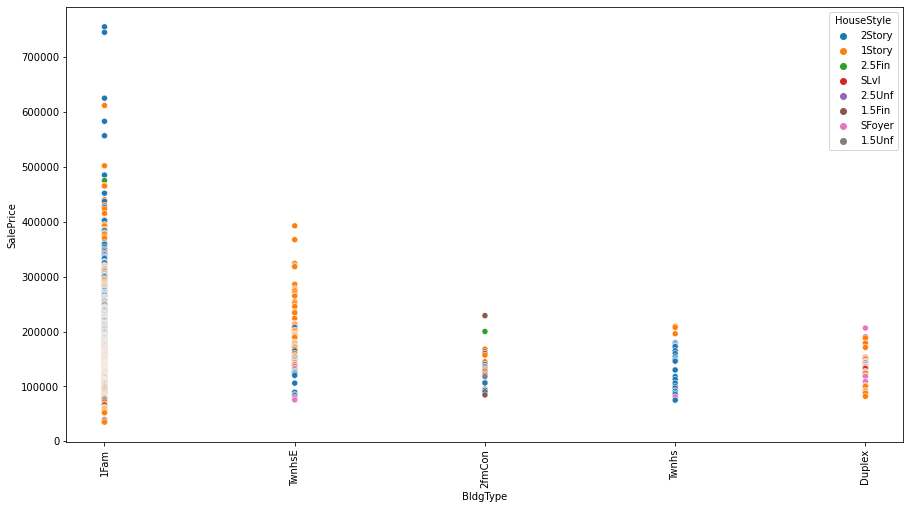

In [81]:
# Let's check relation of the type & style of dwelling on sales price.

plt.figure(figsize = [15, 8])

sns.scatterplot(x = 'BldgType', y = 'SalePrice', hue = 'HouseStyle', data = df.sort_values('SalePrice', ascending = False))

plt.xticks(rotation = 90)

plt.show()

In [82]:
# Checking for counts of overall quality of material and finish of the house

df['OverallQual'].value_counts()

5     397
6     374
7     319
8     168
4     116
9      43
3      20
10     18
2       3
1       2
Name: OverallQual, dtype: int64

In [83]:
# Check overall condition of the house

df['OverallCond'].value_counts()

5    821
6    252
7    205
8     72
4     57
3     25
9     22
2      5
1      1
Name: OverallCond, dtype: int64

<Figure size 1080x576 with 0 Axes>

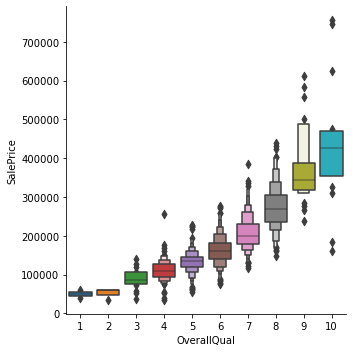

In [84]:
# Check the sale prices based on the ratings of overall material and finish of the house

plt.figure(figsize = [15, 8])

sns.catplot(x = 'OverallQual', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False), kind = 'boxen')

plt.show()

<Figure size 1080x576 with 0 Axes>

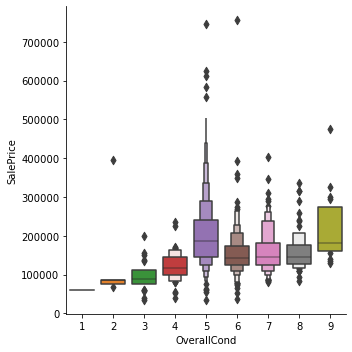

In [85]:
# Check the sale prices based on the ratings of overall condition of the house

plt.figure(figsize = [15, 8])

sns.catplot(x = 'OverallCond', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False), kind = 'boxen')

plt.show()

In [86]:
# Check count of Roof style of the houses

df['RoofStyle'].value_counts()

Gable      1141
Hip         286
Flat         13
Gambrel      11
Mansard       7
Shed          2
Name: RoofStyle, dtype: int64

In [87]:
# Check count of Roof material used.

df['RoofMatl'].value_counts()

CompShg    1434
Tar&Grv      11
WdShngl       6
WdShake       5
Roll          1
ClyTile       1
Metal         1
Membran       1
Name: RoofMatl, dtype: int64

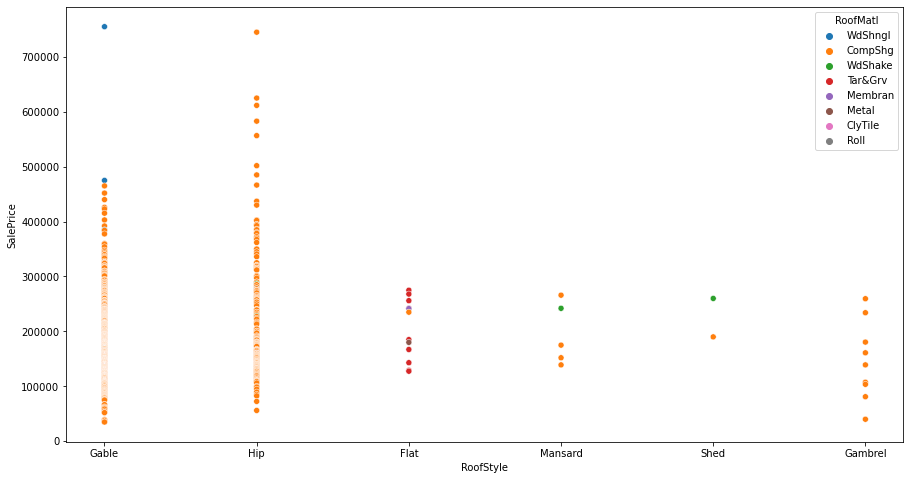

In [88]:
# Check the effect of Roof Style on sale price

plt.figure(figsize = [15, 8])

sns.scatterplot(x = 'RoofStyle', y = 'SalePrice', hue = 'RoofMatl', data = df.sort_values('SalePrice', ascending = False))

plt.show()

In [89]:
# Check counts of the exterior covering on house

df['Exterior1st'].value_counts()

VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
Stone        2
BrkComm      2
AsphShn      1
ImStucc      1
CBlock       1
Name: Exterior1st, dtype: int64

In [90]:
# Check counts of the exterior covering on house (if more than one material)

df['Exterior2nd'].value_counts()

VinylSd    504
MetalSd    214
HdBoard    207
Wd Sdng    197
Plywood    142
CmentBd     60
Wd Shng     38
Stucco      26
BrkFace     25
AsbShng     20
ImStucc     10
Brk Cmn      7
Stone        5
AsphShn      3
Other        1
CBlock       1
Name: Exterior2nd, dtype: int64

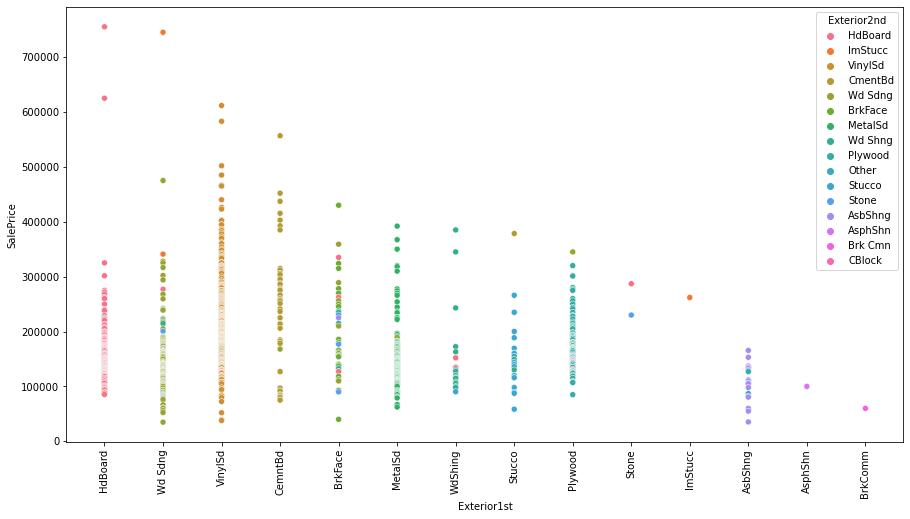

In [91]:
# Check effect of exterior covering on the sale price

plt.figure(figsize = [15, 8])

sns.scatterplot(x = 'Exterior1st', y = 'SalePrice', hue = 'Exterior2nd', data = df.sort_values('SalePrice', ascending = False))

plt.xticks(rotation = 90)

plt.show()

In [92]:
# Check count of the masonry veneer type.

df['MasVnrType'].value_counts()

None       872
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

<AxesSubplot:xlabel='MasVnrArea', ylabel='SalePrice'>

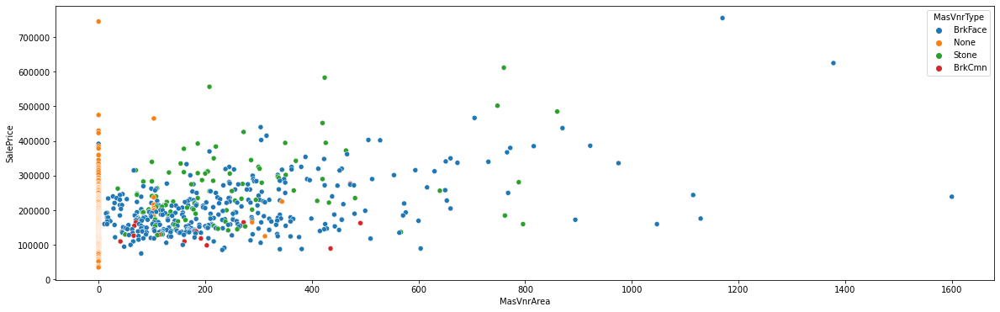

In [93]:
# Check for the sale price based on the masonry veneer

plt.figure(figsize = [20, 6])

sns.scatterplot(x = 'MasVnrArea', y = 'SalePrice', hue = 'MasVnrType', data = df.sort_values('SalePrice', ascending = False))

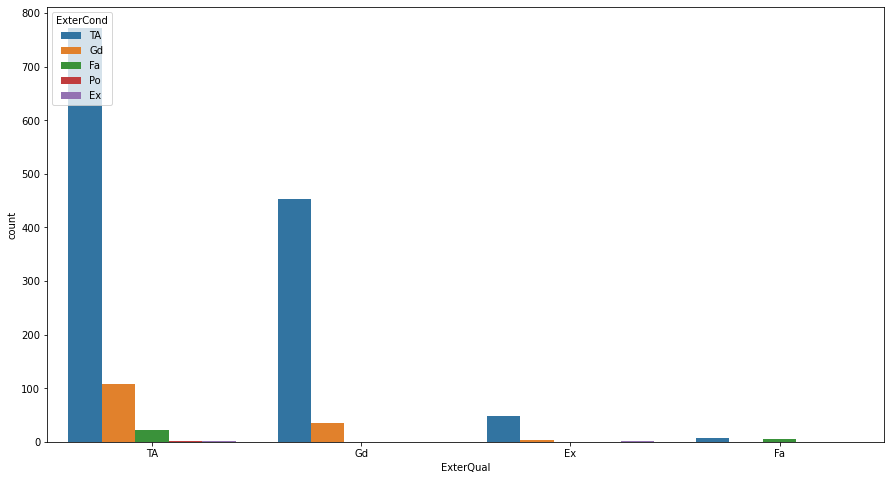

In [94]:
# Check the counts of the quality of the material on the exterior

plt.figure(figsize = [15, 8])

sns.countplot(x = 'ExterQual', hue = 'ExterCond', data = df)

plt.show()

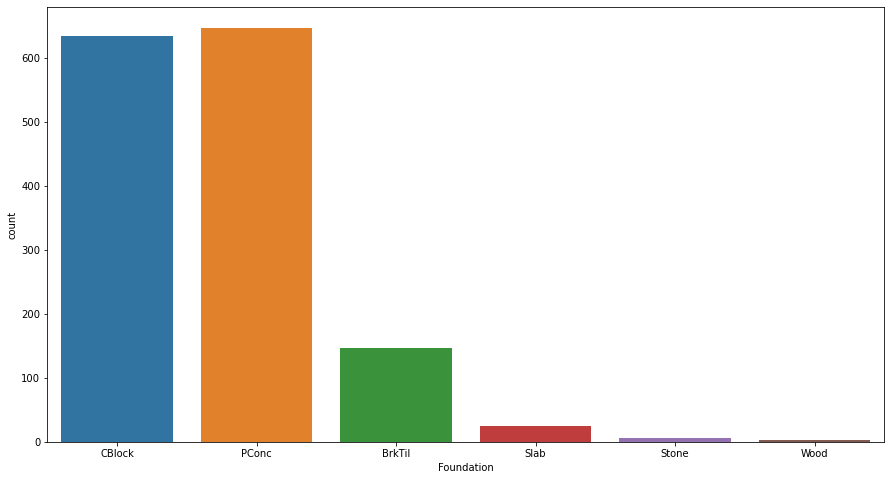

In [95]:
# Check the type of foundation of houses

plt.figure(figsize = [15, 8])

sns.countplot(x = 'Foundation', data = df)

plt.show()

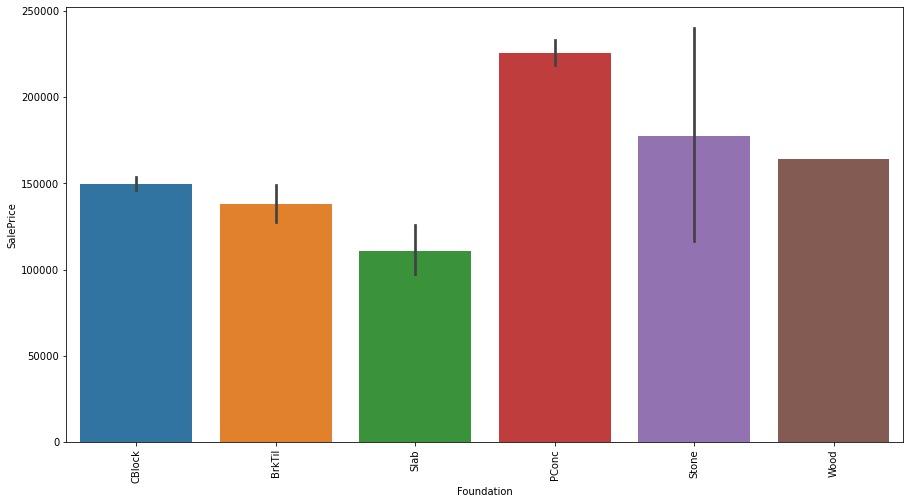

In [96]:
# Effect of foundation on the sale price

plt.figure(figsize = [15, 8])

sns.barplot(x = 'Foundation', y = 'SalePrice', data = df.sort_values('SalePrice'))

plt.xticks(rotation = 90)

plt.show()


In [97]:
# Check central air conditioning availability.

df['CentralAir'].value_counts()

Y    1365
N      95
Name: CentralAir, dtype: int64

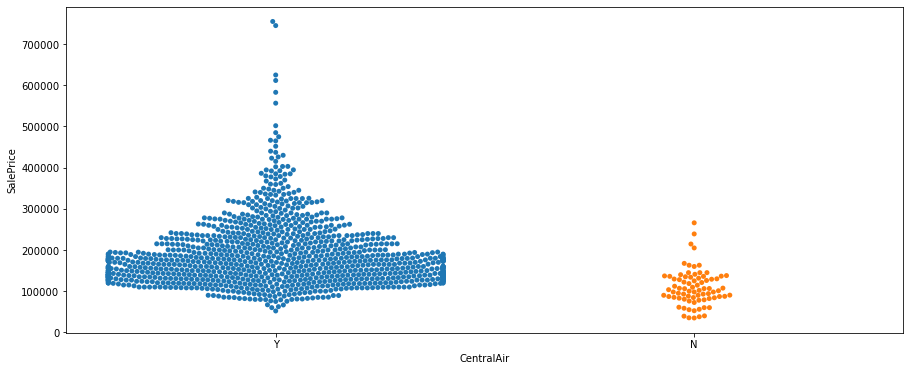

In [98]:
# Check price of the houses on the basis of air conditioning

plt.figure(figsize = [15, 6])

sns.swarmplot(x = 'CentralAir', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False))

plt.show()

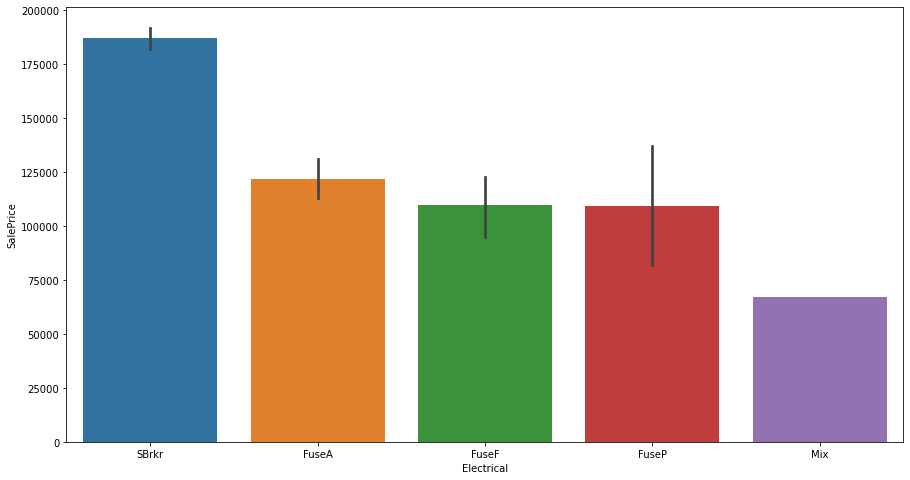

In [99]:
# Check effect of sale price due to electrical system of the house 

plt.figure(figsize = [15, 8])

sns.barplot(x = 'Electrical', y = 'SalePrice', data = df.sort_values('SalePrice', ascending = False))

plt.show()

In [100]:
# Check functionality of homes.

df['Functional'].value_counts()

Typ     1360
Min2      34
Min1      31
Mod       15
Maj1      14
Maj2       5
Sev        1
Name: Functional, dtype: int64

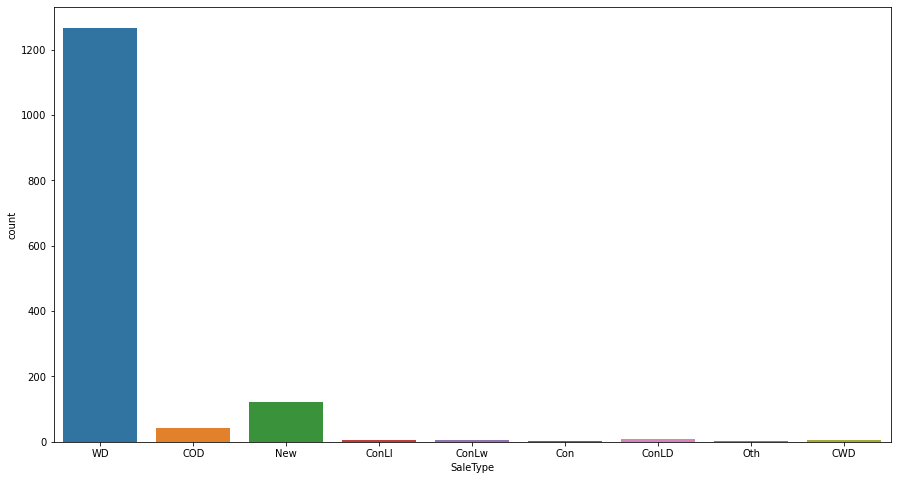

In [101]:
# Let's check for the Type of sale.

plt.figure(figsize = [15, 8])

sns.countplot(df['SaleType'])

plt.show()

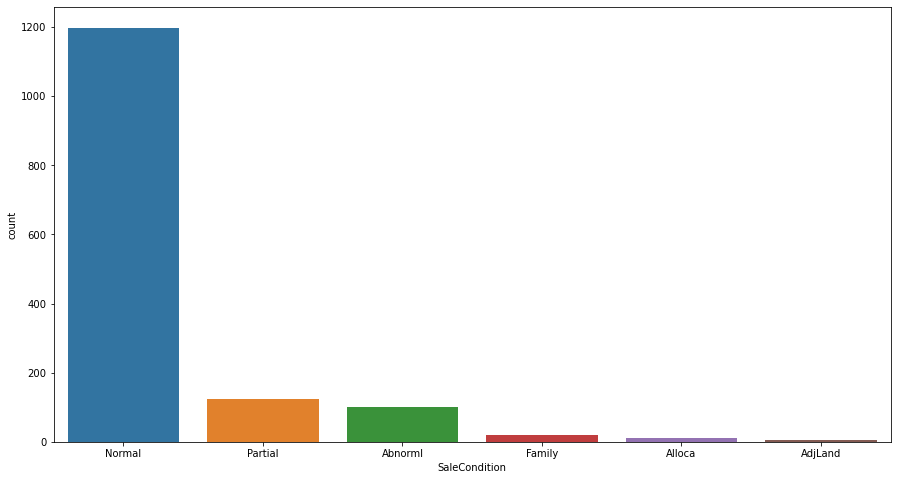

In [102]:
# Check count the sale condition

plt.figure(figsize = [15, 8])

sns.countplot(df['SaleCondition'])

plt.show()

# Label Encoding of Catagorical columns

In [104]:
le = LabelEncoder()

In [105]:
cat_columns = ('MSZoning', 'Street','LotShape', 'LandContour',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType','GarageYrBlt', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'Source')

for c in cat_columns:
    le.fit(list(df[c].values))
    le.classes_
    df[c] = le.transform(list(df[c].values))

In [106]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Source
0,127,120,3,70.049958,4928,1,0,3,4,0,13,2,2,4,2,6,5,1976,1976,1,1,9,10,2,0.0,3,4,1,2,4,4,0,120,6,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,5,1,63,2,2,440,5,5,2,0,205,0,0,0,0,3,4,1,0,2,2007,8,4,128000.0,1
1,889,20,3,95.000000,15865,1,0,3,4,1,12,2,2,0,2,8,6,1970,1970,0,5,13,14,2,0.0,2,2,2,4,1,1,0,351,5,823,1043,2217,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,5,1,56,3,2,621,5,5,2,81,207,0,0,224,0,3,4,1,0,10,2007,8,4,268000.0,1
2,793,60,3,92.000000,9920,1,0,3,1,0,15,2,2,0,5,7,5,1996,1997,1,1,8,8,2,0.0,2,4,2,2,4,0,2,862,6,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,5,1,83,3,2,455,5,5,2,180,130,0,0,0,0,3,4,1,0,6,2007,8,4,269790.0,1
3,110,20,3,105.000000,11751,1,0,3,4,0,14,2,2,0,2,6,6,1977,1977,3,1,9,10,1,480.0,3,4,1,2,4,4,1,705,6,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,5,1,63,2,2,546,5,5,2,0,122,0,0,0,0,3,2,1,0,1,2010,0,4,190000.0,1
4,422,20,3,70.049958,16635,1,0,3,2,0,14,2,2,0,2,6,7,1977,2000,1,1,5,5,3,126.0,2,4,1,2,4,4,0,1246,6,0,356,1602,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,5,1,63,0,2,529,5,5,2,240,0,0,0,0,0,3,4,1,0,6,2009,8,4,215000.0,1


# Data Distribution of different columns

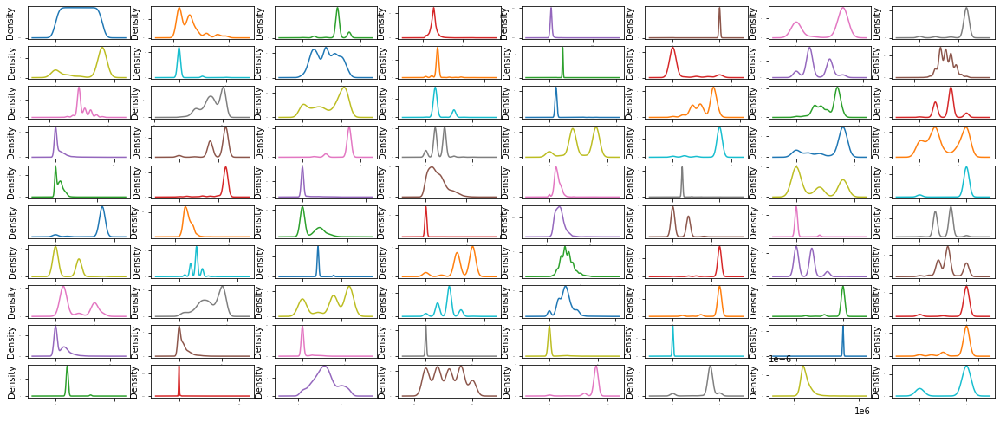

In [108]:
df.plot(kind = 'density', subplots = True, layout = (12, 8), sharex = False, legend = False, fontsize = 1, figsize = [20, 10])

plt.show()

In [110]:
# Statistical description of dataset

df.describe()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Source
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1168.000000,1460.000000
mean,730.500000,56.897260,3.028767,70.049958,10516.828082,0.995890,1.942466,2.777397,3.019178,0.062329,12.251370,2.031507,2.008219,0.493151,3.038356,6.099315,5.575342,1971.267808,1984.865753,1.410274,1.075342,9.624658,10.339726,1.762329,103.685262,2.539726,3.733562,1.396575,2.724658,3.691096,2.936986,3.150000,443.639726,5.586986,46.549315,567.240411,1057.429452,1.036301,1.538356,0.934932,3.682192,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,2.339726,6.517808,5.749315,0.613014,3.087671,2.485616,66.534932,1.876712,1.767123,472.980137,4.716438,4.763014,1.856164,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,2.991096,3.504795,1.069178,43.489041,6.321918,2007.815753,7.513014,3.770548,181477.005993,0.800000
std,421.610009,42.300571,0.632017,22.024023,9981.264932,0.063996,1.409156,0.707666,1.622634,0.276232,6.013735,0.868515,0.259040,1.198277,1.911305,1.382997,1.112799,30.202904,20.645407,0.834998,0.599127,3.197659,3.540570,0.614274,180.569112,0.693995,0.731807,0.722394,1.278630,0.949616,1.567797,2.251517,456.098091,1.200854,161.319273,441.866955,438.705324,0.295124,1.739524,0.246731,1.051301,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,0.830161,1.625393,0.979659,0.644666,1.167523,1.933206,24.635620,1.191646,0.747315,213.804841,0.898787,0.802670,0.496592,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,0.140703,1.082912,0.372102,496.123024,2.703626,1.328095,1.552100,1.100854,79105.586863,0.400137
min,1.000000,20.000000,0.000000,21.000000,1300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

In [111]:
# Corelation of dataset with each other

df.corr()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Source
Id,1.000000,0.011156,-0.006096,-0.009601,-0.033226,0.008916,0.032122,-0.019659,0.049756,0.005847,-0.013735,-0.003815,0.001839,0.021912,0.018111,-0.028365,0.012609,-0.012713,-0.021998,0.038675,-0.022562,-0.034694,-0.042847,0.051971,-0.050199,0.001689,0.029826,0.008514,0.047668,0.007223,-0.025879,0.016616,-0.005024,0.045877,-0.005968,-0.007940,-0.015415,0.042120,0.002157,0.009821,0.037632,0.010496,0.005590,-0.044230,0.008273,0.002289,-0.020155,0.005587,0.006784,0.037719,0.002951,-0.004432,0.027239,-0.001064,-0.019772,0.003765,-0.007822,-0.004807,-0.004626,0.016570,0.017634,0.001955,-0.008379,0.005971,-0.029643,-0.000477,0.002889,-0.046635,0.001330,0.057044,-0.033928,-0.000399,-0.038103,-0.006242,0.021172,0.000712,0.019773,-0.005806,-0.023897,-0.030199
MSSubClass,0.011156,1.000000,0.035900,-0.357056,-0.139781,-0.024969,0.119289,-0.002940,0.075910,-0.025672,-0.005985,-0.024762,-0.042395,0.746063,0.397161,0.032628,-0.059316,0.027850,0.040581,-0.117817,-0.031336,-0.089159,-0.137229,-0.029850,0.022895,-0.017161,-0.003254,0.058126,-0.081702,-0.017905,-0.065218,0.006437,-0.069836,0.037025,-0.065649,-0.140759,-0.238518,0.048009,0.020760,-0.101774,0.051945,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.010129,0.040380,0.003711,-0.045569,0.050200,0.133138,0.105910,-0.028806,-0.040110,-0.098672,-0.038571,-0.045895,-0.059925,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.005221,0.086360,-0.046881,-0.007683,-0.013585,-0.021407,0.012464,-0.024940,-0.060775,-0.006115
MSZoning,-0.006096,0.035900,1.000000,-0.106363,-0.034452,0.087654,0.061887,-0.017854,-0.009895,-0.022055,-0.249679,-0.027874,0.044606,0.005690,-0.105315,-0.160099,0.186951,-0.308908,-0.174728,-0.000301,0.005133,-0.008558,0.006963,-0.028279,-0.066766,0.200536,-0.096041,-0.235174,0.160778,-0.011450,0.037108,0.026347,-0.049128,-0.034004,0.028086,-0.046749,-0.087834,0.056866,0.134279,-0.049523,-0.070818,-0.055614,-0.051481,0.011520,-0.082615,-0.018526,0.007193,-0.198290,-0.133876,-0.016471,0.049434,0.128976,-0.043200,-0.095722,-0.011349,-0.002491,0.141142,-0.235573,0.117559,-0.157042,-0.189250,-0.162998,-0.102744,-0.100366,-0.009477,-0.154704,0.115509,0.000362,0.019089,-0.003128,0.002882,-0.061289,-0.005553,0.009293,-0.031496,-0.020628,0.097437,0.009494,-0.133221,-0.047700
LotFrontage,-0.009601,-0.357056,-0.106363,1.000000,0.306795,-0.037323,-0.144931,-0.075647,-0.181253,0.067608,0.084545,-0.008483,0.003214,-0.408564,0.031907,0.234196,-0.052820,0.117598,0.082746,0.153467,0.082026,0.074448,0.098756,-0.020220,0.179283,-0.183293,0.047951,0.098809,-0.139701,0.055936,-0.130047,-0.023136,0.215828,-0.017142,0.043340,0.122156,0.363358,-0.020815,-0.079975,0.068666,0.060213,0.414266,0.072483,0.036849,0.368392,0.091481,-0.006419,0.180424,0.048258,0.237023,-0.005805,-0.189082,0.320146,0.030250,0.235755,-0.016492,-0.255709,0.031195,-0.155136,0.269729,0.323663,0.094808,0.091630,0.089073,0.077106,0.137454,0.009790,0.062335,0.037684,0.180868,-0.191630,-0.036751,0.009213,0.001168,0.010158,0.006768,-0.030846,0.058464,0.323850,0.069635
LotArea,-0.033226,-0.139781,-0.034452,0.306795,1.000000,-0.197131,-0.165315,

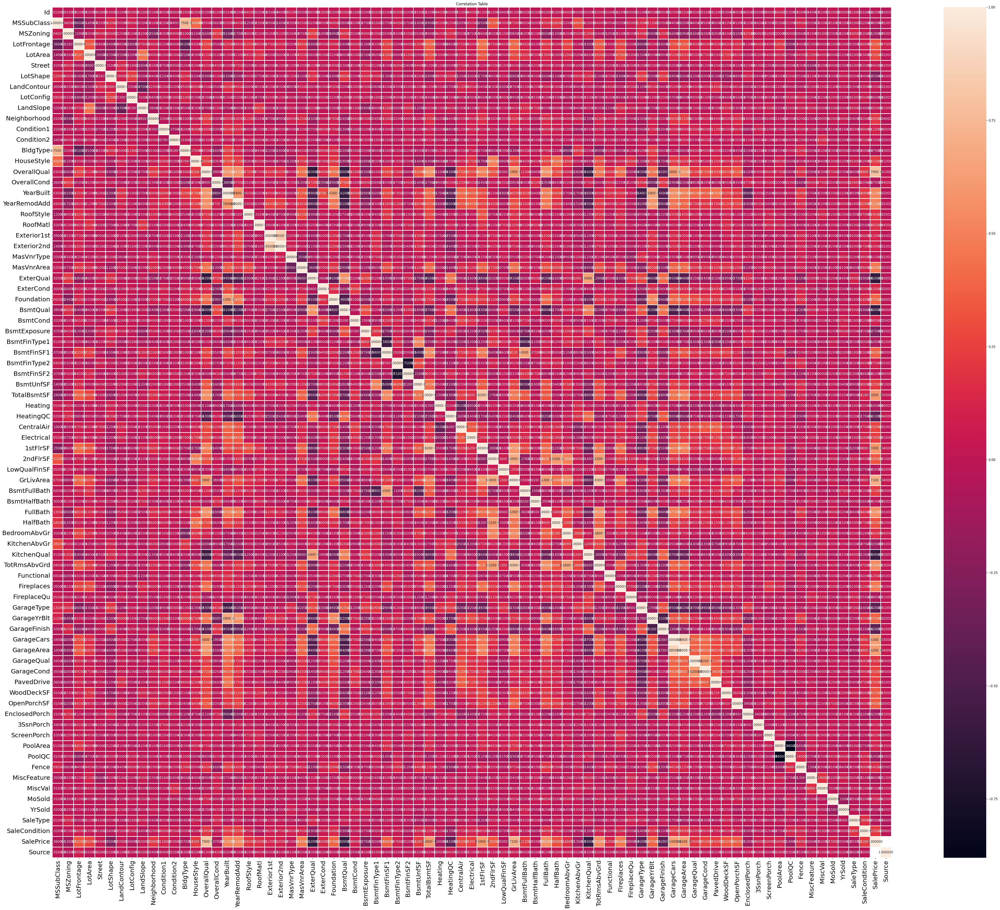

In [115]:
#Plotting a heatmap for the corelation matrix

plt.figure(figsize = [60, 50])

sns.heatmap(round(df.corr()[1:].transpose(), 2), annot = True, linewidths = 0.2, linecolor = 'white', fmt = 'f')

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.title('Correlation Table')

plt.show()

# Split dataset in TEST & TRAIN dataset

In [117]:
# Train dataset

train_data = df[ : 1168]

train_data = train_data.drop(['Source'], axis = 1)

train_data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,3,70.049958,4928,1,0,3,4,0,13,2,2,4,2,6,5,1976,1976,1,1,9,10,2,0.000000,3,4,1,2,4,4,0,120,6,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,5,1,63,2,2,440,5,5,2,0,205,0,0,0,0,3,4,1,0,2,2007,8,4,128000.0
1,889,20,3,95.000000,15865,1,0,3,4,1,12,2,2,0,2,8,6,1970,1970,0,5,13,14,2,0.000000,2,2,2,4,1,1,0,351,5,823,1043,2217,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,5,1,56,3,2,621,5,5,2,81,207,0,0,224,0,3,4,1,0,10,2007,8,4,268000.0
2,793,60,3,92.000000,9920,1,0,3,1,0,15,2,2,0,5,7,5,1996,1997,1,1,8,8,2,0.000000,2,4,2,2,4,0,2,862,6,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,5,1,83,3,2,455,5,5,2,180,130,0,0,0,0,3,4,1,0,6,2007,8,4,269790.0
3,110,20,3,105.000000,11751,1,0,3,4,0,14,2,2,0,2,6,6,1977,1977,3,1,9,10,1,480.000000,3,4,1,2,4,4,1,705,6,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,5,1,63,2,2,546,5,5,2,0,122,0,0,0,0,3,2,1,0,1,2010,0,4,190000.0
4,422,20,3,70.049958,16635,1,0,3,2,0,14,2,2,0,2,6,7,1977,2000,1,1,5,5,3,126.000000,2,4,1,2,4,4,0,1246,6,0,356,1602,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,5,1,63,0,2,529,5,5,2,240,0,0,0,0,0,3,4,1,0,6,2009,8,4,215000.0
5,1197,60,3,58.000000,14054,1,0,3,4,0,8,2,2,0,5,7,5,2006,2006,1,1,12,13,2,0.000000,2,4,2,2,4,0,6,0,6,0,879,879,1,0,1,4,879,984,0,1863,0,0,2,1,4,1,2,9,6,1,2,3,92,0,3,660,5,5,2,100,17,0,0,0,0,3,4,1,0,11,2006,6,5,219210.0
6,561,20,3,70.049958,11341,1,0,3,4,0,19,2,2,0,2,5,6,1957,1996,3,1,13,14,1,180.000000,3,4,1,2,4,4,0,1302,6,0,90,1392,1,4,1,4,1392,0,0,1392,1,0,1,1,3,1,3,5,4,1,2,5,43,3,2,528,5,5,2,0,0,0,0,95,0,3,4,1,0,5,2010,8,4,121500.0
7,1041,20,3,88.000000,13125,1,3,3,0,0,19,2,2,0,2,5,4,1957,2000,1,1,13,14,0,67.000000,3,4,1,4,4,4,5,168,1,682,284,1134,1,0,1,4,1803,0,0,1803,1,0,2,0,3,1,3,8,0,1,5,1,43,2,2,484,5,5,2,0,0,0,0,0,0,3,0,1,0,1,2006,8,4,155000.0
8,503,20,3,70.000000,9170,1,3,3,0,0,7,1,2,0,2,5,7,1965,1965,3,1,8,8,2,0.000000,3,4,1,4,4,4,0,698,2,96,420,1214,1,0,1,4,1214,0,0,1214,1,0,1,0,2,1,3,6,6,0,3,5,51,3,2,461,1,1,2,0,0,184,0,0,0,3,0,3,400,4,2007,8,4,140000.0
9,576,50,3,80.000000,8480,1,3,3,4,0,12,2,2,0,0,5,5,1947,1950,1,1,8,8,2,0.000000,3,4,1,4,4,4,5,442,6,0,390,832,1,4,1,4,832,384,0,1216,0,0,1,0,2,1,3,6,6,0,3,5,33,3,1,336,5,5,2,158,0,102,0,0,0,3,4,1,0,10,2008,0,0,118500.0


In [118]:
# test dataset:

test_data = df[1168 : ]

test_data = test_data.drop(['Source', 'SalePrice'], axis = 1)

test_data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1168,337,20,3,86.000000,14157,1,0,1,0,0,22,2,2,0,2,9,5,2005,2006,3,1,12,13,3,200.000000,2,4,2,0,4,1,2,1249,6,0,673,1922,1,0,1,4,1922,0,0,1922,1,0,2,0,3,1,2,8,6,1,2,1,91,0,3,676,5,5,2,178,51,0,0,0,0,3,4,1,0,7,2007,8,4
1169,1018,120,3,70.049958,5814,1,0,3,1,0,22,2,2,4,2,8,5,1984,1984,1,1,6,6,2,0.000000,2,4,1,2,4,0,2,1036,6,0,184,1220,1,2,1,4,1360,0,0,1360,1,0,1,0,1,1,2,4,6,1,0,1,70,2,2,565,5,5,2,63,0,0,0,0,0,3,4,1,0,8,2009,0,0
1170,929,20,3,70.049958,11838,1,3,3,4,0,5,2,2,0,2,8,5,2001,2001,3,1,12,13,2,0.000000,2,4,2,2,4,0,6,0,6,0,1753,1753,1,0,1,4,1788,0,0,1788,0,0,2,0,3,1,0,7,6,1,5,1,87,2,2,522,5,5,2,202,151,0,0,0,0,3,4,1,0,6,2009,8,4
1171,1148,70,3,75.000000,12000,1,3,0,4,0,6,2,2,0,5,7,7,1941,1950,1,1,8,8,2,0.000000,3,4,1,4,4,4,5,275,6,0,429,704,1,0,1,4,860,704,0,1564,0,0,1,1,3,1,1,7,6,1,2,1,29,3,1,234,5,5,2,0,0,0,0,0,0,3,4,1,0,7,2009,8,4
1172,1227,60,3,86.000000,14598,1,0,3,1,0,21,1,2,0,5,6,5,2007,2007,1,1,12,13,3,74.000000,2,4,2,2,4,2,6,0,6,0,894,894,1,0,1,4,894,1039,0,1933,0,0,2,1,4,1,2,9,6,1,2,3,93,0,3,668,5,5,2,100,18,0,0,0,0,3,4,1,0,1,2008,8,4
1173,650,180,4,21.000000,1936,1,3,3,4,0,10,2,2,3,6,4,6,1970,1970,1,1,5,5,2,0.000000,3,4,1,2,4,0,1,131,2,499,0,630,1,2,1,4,630,0,0,630,1,0,1,0,1,1,3,3,6,0,3,6,97,1,0,0,3,3,2,0,0,0,0,0,0,3,2,1,0,12,2007,8,4
1174,1453,180,4,35.000000,3675,1,3,3,4,0,7,2,2,4,7,5,5,2005,2005,1,1,12,13,1,80.000000,3,4,2,2,4,1,2,547,6,0,0,547,1,2,1,4,1072,0,0,1072,1,0,1,0,2,1,3,5,6,0,3,2,91,0,2,525,5,5,2,0,28,0,0,0,0,3,4,1,0,5,2006,8,4
1175,152,20,3,107.000000,13891,1,3,3,4,0,16,2,2,0,2,8,5,2007,2008,3,1,12,13,3,436.000000,2,4,2,0,4,1,2,1400,6,0,310,1710,1,0,1,4,1710,0,0,1710,1,0,2,0,2,1,2,6,6,1,2,1,93,2,3,866,5,5,2,0,102,0,0,0,0,3,4,1,0,1,2008,6,5
1176,427,80,3,70.049958,12800,1,3,2,4,1,20,2,2,0,7,7,5,1989,1989,1,1,13,14,1,145.000000,2,4,2,2,4,1,2,1518,6,0,0,1518,1,2,1,4,1644,0,0,1644,1,1,2,0,2,1,2,5,6,1,5,1,75,0,2,569,5,5,2,80,0,0,0,396,0,3,4,1,0,8,2009,8,4
1177,776,120,4,32.000000,4500,1,3,3,2,0,11,2,2,4,2,6,5,1998,1998,3,1,12,13,1,320.000000,3,4,2,0,4,4,2,866,6,0,338,1204,1,0,1,4,1204,0,0,1204,1,0,2,0,2,1,3,5,6,0,3,1,84,0,2,412,5,5,2,0,247,0,0,0,0,3,4,1,0,6,2009,8,4


# Check skewness and outliers in training dataset

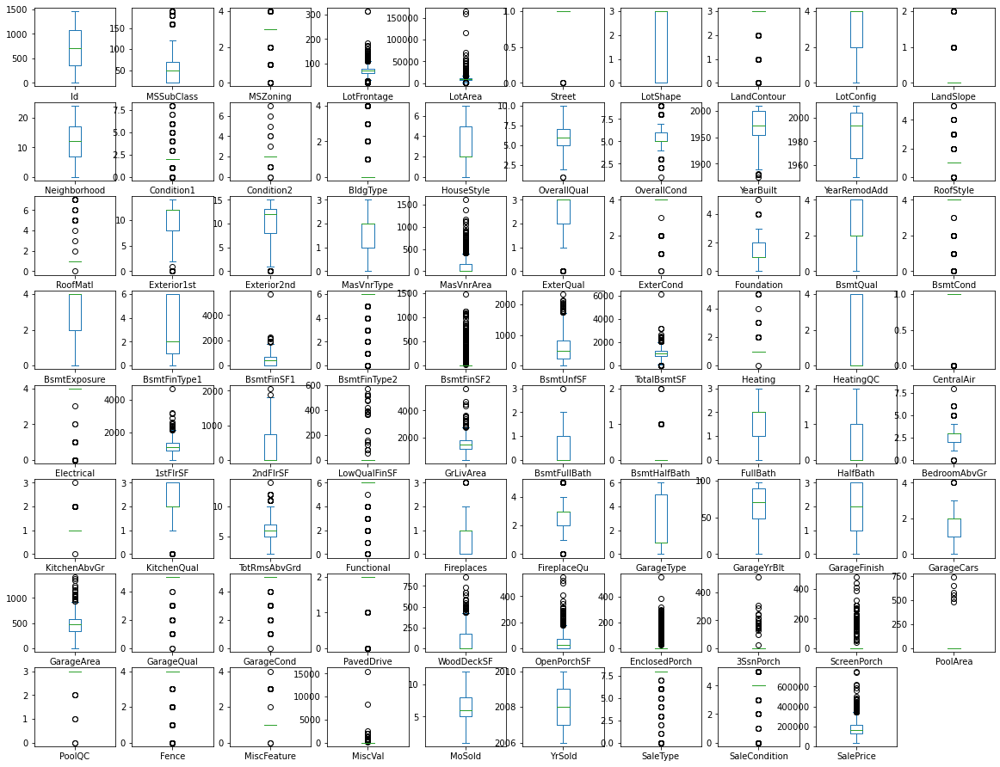

In [122]:
# Check for the outliers

train_data.plot(kind = 'box', subplots = True, layout = (20, 10), sharex = False, legend = True, figsize = (20, 40))

plt.show()

# Removing Outliers using Zscore

In [124]:
z = np.abs(zscore(train_data))

z.shape

(1168, 79)

In [125]:
thershold = 6

print(np.where (z > 6))

(array([   1,   20,   22,   32,   32,   33,   51,   51,   63,   66,   95,
         98,  103,  103,  103,  113,  113,  119,  119,  141,  141,  141,
        142,  206,  211,  211,  214,  214,  226,  228,  253,  255,  272,
        279,  310,  310,  310,  320,  333,  356,  361,  363,  370,  396,
        418,  429,  441,  441,  443,  463,  478,  481,  488,  493,  500,
        500,  507,  510,  532,  534,  544,  553,  562,  563,  572,  572,
        572,  572,  591,  592,  592,  592,  592,  592,  592,  592,  614,
        614,  637,  639,  652,  686,  689,  689,  691,  691,  699,  713,
        716,  721,  722,  759,  769,  794,  821,  824,  833,  833,  834,
        839,  846,  888,  897,  899,  911,  920,  920,  935,  944,  952,
        952,  956,  961, 1008, 1023, 1038, 1038, 1046, 1047, 1053, 1053,
       1080, 1082, 1094, 1098, 1108, 1120, 1120, 1120, 1120, 1123, 1123,
       1123, 1139, 1142], dtype=int64), array([20, 67, 34, 12, 73, 43, 65, 68, 67, 43, 34, 67, 20, 43, 68,  4,  9,
       2

In [126]:
# New df i.e train_new which has less of thershold value and removing the outliers

train_new = train_data[(z < 6).all(axis = 1)]

print(train_data.shape)

print(train_new.shape)

(1168, 79)
(1069, 79)


In [128]:
# Percentage of data loss:

loss_per = ((1168 - 1069) / 1168) * 100

print ('Percentage Data Lost: ', loss_per)

Percentage Data Lost:  8.476027397260275


In [130]:
# Dividing the dependent and independent variables

x = train_data.drop('SalePrice', axis = 1)

y = train_data['SalePrice']

In [131]:
# CHeck the skewness

x.skew()

Id                0.026526
MSSubClass        1.422019
MSZoning         -1.796785
LotFrontage       2.732333
LotArea          10.659285
Street          -17.021969
LotShape         -0.603775
LandContour      -3.125982
LotConfig        -1.118821
LandSlope         4.812568
Neighborhood      0.043735
Condition1        3.008289
Condition2       11.514458
BldgType          2.318657
HouseStyle        0.285680
OverallQual       0.175082
OverallCond       0.580714
YearBuilt        -0.579204
YearRemodAdd     -0.495864
RoofStyle         1.498560
RoofMatl          7.577352
Exterior1st      -0.750566
Exterior2nd      -0.699672
MasVnrType       -0.104609
MasVnrArea        2.834520
ExterQual        -1.810843
ExterCond        -2.516219
Foundation       -0.002761
BsmtQual         -0.487530
BsmtCond         -2.816444
BsmtExposure     -0.960565
BsmtFinType1      0.100811
BsmtFinSF1        1.871606
BsmtFinType2     -3.144813
BsmtFinSF2        4.365829
BsmtUnfSF         0.909057
TotalBsmtSF       1.744591
H

In [133]:
# Using Power transform to remove skewness

x = power_transform(x)

x

array([[-1.54496771,  1.37043472, -0.16245555, ..., -0.60480623,
         0.40906852,  0.02973497],
       [ 0.46194084, -1.16799937, -0.16245555, ..., -0.60480623,
         0.40906852,  0.02973497],
       [ 0.25422089,  0.4900471 , -0.16245555, ..., -0.60480623,
         0.40906852,  0.02973497],
       ...,
       [-1.30033656,  1.70079775, -0.16245555, ...,  0.89957552,
         0.40906852,  0.02973497],
       [-1.97567978,  0.69655685, -2.92646435, ...,  0.14807039,
         0.40906852,  0.02973497],
       [-0.14748082,  0.4900471 , -0.16245555, ..., -1.3590026 ,
         0.40906852,  0.02973497]])

# Building a Model

In [134]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.20, random_state = 95)

# Linear Regeression

In [136]:
LR = LinearRegression( fit_intercept = True)

LR.fit(x_train, y_train)

print(f"Linear coefficients : {LR.coef_}")

print(f"Intercept : {LR.intercept_}")

Linear coefficients : [ 8.04790564e+02 -1.20077482e+02 -4.42633495e+02 -4.83129226e+02
  5.31982721e+03  1.44888475e+03  1.06214206e+03  2.83107141e+03
 -9.95819102e+02  1.47451260e+03  1.56755731e+03 -2.27495348e+02
 -1.55840308e+03 -4.76417352e+03 -1.56655229e+03  1.62573006e+04
  5.33393517e+03 -1.56172758e+03  1.96046251e+02  6.36285393e+03
  1.29081906e+04 -3.19575534e+02 -2.06543084e+03  8.89340226e+02
  1.44383076e+02 -4.87075521e+03  8.77235771e+02  1.72866643e+03
 -5.19870454e+03 -3.33257264e+02 -4.63995568e+03  1.17102283e+03
  6.46940097e+03 -9.18567173e+03 -9.51942784e+03 -3.99202893e+03
  1.41410005e+04 -1.12407848e+03 -2.24923149e+03  7.90005660e+02
 -1.71444127e+03 -1.29803370e+03 -1.43075950e+02 -2.30493388e+03
  1.71656808e+04  1.62195213e+03 -1.68202138e+03  3.25380039e+03
  5.01434452e+03 -1.62683466e+03 -1.75451444e+03 -5.88954564e+03
  3.36725263e+03  3.24373468e+03  4.17286959e+03 -3.15402690e+03
  2.48181349e+03  3.20898134e+03 -2.71591970e+03  8.85644082e+03
  3

In [137]:
# Predicting the new result

LR_pred = LR.predict(x_test)

LR_pred

array([256663.48889186, 204256.98889186, 109939.48889186, 246510.48889186,
       107975.48889186, 184966.48889186, 337653.48889186, 139746.98889186,
       167643.98889186, 225298.48889186, 186959.48889186, 313872.48889186,
       140105.48889186, 199261.98889186, 195287.48889186,  78339.98889186,
       126659.48889186, 140308.48889186, 317649.48889186, 140282.98889186,
        83359.98889186, 195385.48889186, 168258.48889186, 198821.48889186,
       202697.48889186, 299496.48889186, 117963.98889186, 106932.48889186,
       140034.98889186, 165237.48889186, 228224.48889186,  94089.98889186,
       248640.48889186, 232558.48889186, 196515.98889186, 175327.98889186,
       176099.48889186, 146071.48889186, 242107.98889186, 144213.48889186,
       115161.48889186, 104046.48889186, 266915.48889186, 129113.48889186,
       150502.48889186,  58065.98889186, 329370.48889186, 218131.48889186,
       152314.98889186, 189501.98889186, 238500.98889186, 215438.98889186,
       286319.48889186, 3

# Lasso

In [139]:
ls = Lasso()

ls.fit(x_train, y_train)

# Predicting the new results

ls_pred = ls.predict(x_test)

ls_pred

array([256688.08817155, 204223.08659   , 109890.38811304, 246407.94173583,
       107883.22300311, 184983.46133061, 337732.2089803 , 139640.78262227,
       167653.44223094, 225273.71254572, 186903.86792293, 313805.20605809,
       140009.71288715, 199305.45289377, 195258.14272947,  78345.80172911,
       126658.7024441 , 140330.61824404, 317592.78030951, 140199.07543347,
        83326.89017777, 195280.652163  , 168188.21786071, 198854.3630583 ,
       202780.11892162, 299447.88839209, 117983.21397872, 106944.83319864,
       139959.51467239, 165210.80449453, 228238.55930373,  94138.70949859,
       248577.59114329, 232522.80439988, 196442.51447149, 175344.92434395,
       176073.21292545, 146084.07640641, 242039.31062706, 144058.34493572,
       115106.14068428, 104041.26742747, 266912.54877247, 129155.99982369,
       150512.22586034,  58026.86336072, 329300.00986379, 218165.85571348,
       152259.36794295, 189455.87647037, 238506.76817475, 215455.34542988,
       286183.53435009, 3

# Decision Tree Regressor

In [141]:
DT = DecisionTreeRegressor()

DT.fit(x_train, y_train)

# Predicting the new result

DT_pred = DT.predict(x_test)

DT_pred

array([176000., 162000., 135900., 191000., 140000., 132000., 226000.,
       110000., 194000., 205000., 188000., 317000., 112500., 190000.,
       138800., 129000., 133000., 123000., 281000., 108000., 108959.,
       201000., 145000., 165600., 244000., 317000., 135000., 146000.,
       113000., 188000., 227000.,  82000., 236500., 191000., 178000.,
       192000., 178000., 173000., 215000., 133900., 128000., 112000.,
       255000., 147000., 140000.,  80000., 301500., 187750., 136500.,
       163000., 222500., 185500., 302000., 306000., 118500., 236500.,
       139000., 154000.,  95000., 117500., 124500., 611657., 176000.,
       173000., 227875., 175000., 132000.,  76000., 208900., 180000.,
       110000., 260000., 274970., 108000., 378500., 162500., 240000.,
       154000., 135000., 426000., 110000.,  82500., 256000.,  89471.,
        92900., 119000., 149000., 125000., 176000.,  93500., 268000.,
        88000., 142500., 224000., 114500., 129500., 169000., 142500.,
       341000., 2280

# KNN Regressor

In [143]:
KNN = KNeighborsRegressor(n_neighbors = 2)

KNN.fit(x_train, y_train)

KNeighborsRegressor(n_neighbors=2)

In [144]:
# Predicting the new result

KNN_pred = KNN.predict(x_test)

KNN_pred

array([497500. , 190637.5, 128500. , 185850. , 108500. , 135250. ,
       332500. , 112950. , 155450. , 196200. , 185250. , 299875. ,
       147250. , 208000. , 509985. , 104500. , 144600. ,  95691.5,
       262050. , 112000. , 103000. , 273900. , 151750. , 254500. ,
       196250. , 305000. , 142000. , 114250. , 113000. , 196000. ,
       293375. , 123500. , 225000. , 238250. , 146950. , 222250. ,
       158500. , 142950. , 145000. , 144750. , 115000. , 135950. ,
       301000. , 133500. , 144250. ,  86000. , 307000. , 210000. ,
       143450. , 146250. , 238250. , 237790. , 214000. , 191495. ,
        95000. , 221500. , 125250. , 155000. , 145000. , 117750. ,
       144450. , 431966.5, 205700. , 165750. , 234750. , 157475. ,
       193125. , 111250. , 218500. , 165500. , 117750. , 331875. ,
       231500. ,  86000. , 503044.5, 118954. , 174700. , 167975. ,
       174000. , 380500. , 126700. , 126450. , 189700. , 153500. ,
        98600. ,  86750. , 160250. , 110750. , 118000. , 10060

# RandomForestRegressor

In [146]:
RF = RandomForestRegressor(max_depth = 2, random_state = 42)

RF.fit(x_train, y_train)

RandomForestRegressor(max_depth=2, random_state=42)

In [147]:
# Predicting the new result

RF_pred = RF.predict(x_test)

RF_pred

array([152018.811756  , 203612.72279716, 143205.2902323 , 205982.26328349,
       143763.05656626, 209563.64111188, 205502.72175165, 150485.11194221,
       163303.81032812, 209537.30656935, 163303.81032812, 274393.6371864 ,
       148900.23334221, 206605.90343334, 150437.75412853, 128827.01487053,
       129961.13870096, 150081.71498632, 280165.71772777, 130411.89347053,
       130764.11164022, 264053.32885347, 133416.24018354, 164774.45722734,
       207448.12727862, 269602.50783888, 141930.58497411, 132727.20324515,
       162003.80344578, 164774.45722734, 262705.55632178, 129230.41182642,
       263860.1437495 , 210773.39263101, 164774.45722734, 205982.26328349,
       164774.45722734, 152800.42171683, 211870.96106693, 144582.71351743,
       162003.80344578, 144535.35570375, 273214.57011654, 129629.98780979,
       131125.93633315, 128827.01487053, 286416.32538585, 206605.90343334,
       148900.23334221, 204198.72499706, 207448.12727862, 205982.26328349,
       212920.09530163, 2

# MEAN ABSOLUTE ERROR

In [149]:
print(' Mean Absolute Error for LinearRegression is ', mean_absolute_error(y_test, LR_pred),
      '\n Mean Absolute Error for the Lasso is ', mean_absolute_error(y_test, ls_pred),
     '\n Mean Absolute Error for DecisionTreeRegressor is ', mean_absolute_error(y_test, DT_pred),
     '\n Mean Absolute Error for KNeighborsRegressor is ', mean_absolute_error(y_test, KNN_pred),
      '\n Mean Absolute Error for RandomForestRegressor is ', mean_absolute_error(y_test, RF_pred))

 Mean Absolute Error for LinearRegression is  22156.583997922735 
 Mean Absolute Error for the Lasso is  22154.59984041892 
 Mean Absolute Error for DecisionTreeRegressor is  25575.709401709402 
 Mean Absolute Error for KNeighborsRegressor is  29492.096153846152 
 Mean Absolute Error for RandomForestRegressor is  30094.539950999737


# ROOT MEAN SQUARE ERROR

In [151]:
rmse_LR = np.sqrt(metrics.mean_squared_error(y_test, LR_pred))

rmse_ls = np.sqrt(metrics.mean_squared_error(y_test, ls_pred))

rmse_DT = np.sqrt(metrics.mean_squared_error(y_test, DT_pred))

rmse_KNN = np.sqrt(metrics.mean_squared_error(y_test, KNN_pred))

rmse_RF = np.sqrt(metrics.mean_squared_error(y_test, RF_pred))

print('RMSE for LinearRegression is ', rmse_LR)

print('RMSE for Lasso is ', rmse_ls)

print('RMSE for DecisionTreeRegressor is ', rmse_DT)

print('RMSE for KNeighborsRegressor is ', rmse_KNN)

print('RMSE for RandomForestRegressor is ', rmse_RF)

RMSE for LinearRegression is  32895.12600790488
RMSE for Lasso is  32896.55457436605
RMSE for DecisionTreeRegressor is  38926.27201946435
RMSE for KNeighborsRegressor is  54358.71132123481
RMSE for RandomForestRegressor is  44644.049167381185


# We found least RMSE with Linear Regression hence we can consider it as best model, we will cross verify it with R2 method.

In [153]:
print(' R2_Score for LinearRegression is ', r2_score(y_test, LR_pred),
      '\n R2_Score for the Lasso is', r2_score(y_test, ls_pred),
      '\n R2_Score for DecisionTreeRegressor is ', r2_score(y_test, DT_pred),
      '\n R2_Score for KNeighborsRegressor is ', r2_score(y_test, KNN_pred), 
      '\n R2_Score for RandomForestRegressor is ', r2_score(y_test, RF_pred))

 R2_Score for LinearRegression is  0.8419640097230523 
 R2_Score for the Lasso is 0.8419502830805363 
 R2_Score for DecisionTreeRegressor is  0.7787014747073064 
 R2_Score for KNeighborsRegressor is  0.5684499232056501 
 R2_Score for RandomForestRegressor is  0.7089148507145988


# Saving the Model

In [155]:
filename = 'Surprise_housing_price.pkl'

pickle.dump(ls, open(filename, 'wb'))

# Checking difference in original and predicted data

In [156]:
a = np.array(y_test)

predicted = np.array(ls.predict(x_test))

df_conclusion = pd.DataFrame({"Original":a, "Predicted":predicted}, index = range(len(a)))

df_conclusion

,Original,Predicted
0,181000.0,256688.088172
1,176485.0,204223.086590
2,132000.0,109890.388113
3,184000.0,246407.941736
4,107400.0,107883.223003
5,205000.0,184983.461331
6,260000.0,337732.208980
7,116000.0,139640.782622
8,181900.0,167653.442231
9,230000.0,225273.712546


<AxesSubplot:ylabel='Density'>

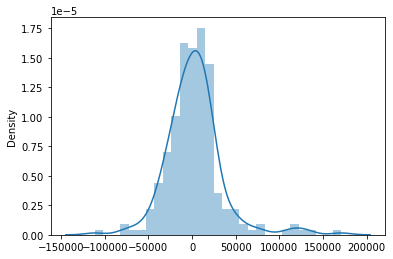

In [157]:
sns.distplot(a-predicted)

# Above plot shows almost perfect distribution

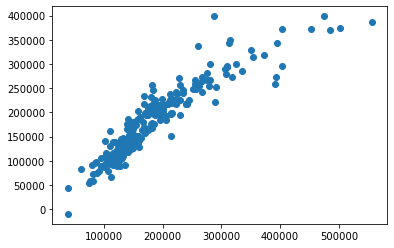

In [159]:
plt.scatter(a, predicted)

# Above we can see linear relationship throughout.